# Detecting robotic grasping points using Keypoint R-CNN

#### Set up

In [2]:
# install packages
# pip install pycocotools
# pip install labelme

In [1]:
# import packages
import json
import os
import numpy as np
from pathlib import Path
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import pycocotools
import vision_utils.utils as utils
from vision_utils.engine import train_one_epoch, evaluate
import random


import torch
import torchvision
from torchvision.ops import nms, box_iou
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.keypoint_rcnn import KeypointRCNNPredictor
from scipy.optimize import linear_sum_assignment

# Reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

### 1. Explore and prepare the dataset

In [2]:
# inspect data
data_root = Path("Data/broccoli") 

In [3]:
# inspect train and test split
splits = ["train", "val", "test"]

print("\nSplit:")
split_stats = {}
for split in splits:
    split_dir = data_root / split
    images = sorted(split_dir.glob("*.png"))
    split_stats[split] = {"images": len(images)}
    print(f"  {split:}: {len(images)} images")


Split:
  train: 963 images
  val: 305 images
  test: 345 images


In [4]:
# Inspect annotation 
with open("Data/broccoli/train/20200713_10103484155_plant1001_rgb_trigger002.json") as f:
    ann = json.load(f)
print("Just a annotation to inspect: ", ann)

for split in ["train", "val", "test"]:
    json_files = sorted((data_root / split).glob("*.json"))[:2] # first 2 from each set
    for jpath in json_files:
        with open(jpath) as f:
            ann = json.load(f)
        print(f"\nSample: {split}/{jpath.name}")
        print(f"Size: {ann['imageWidth']} x {ann['imageHeight']}")
        print(f"Shapes: {len(ann['shapes'])}")
        for s in ann["shapes"]:
            print(f"{s['label']:>10}{s['shape_type']}{s['points']}")


Just a annotation to inspect:  {'version': '4.5.6', 'flags': {}, 'shapes': [{'label': 'broccoli', 'line_color': None, 'fill_color': None, 'points': [[677, 659], [677, 768]], 'shape_type': 'circle', 'flags': {}}], 'lineColor': [0, 255, 0, 128], 'fillColor': [255, 0, 0, 128], 'imagePath': '20200713_10103484155_plant1001_rgb_trigger002.png', 'imageData': None, 'imageHeight': 1280, 'imageWidth': 1280}

Sample: train/20200713_10103484155_plant1001_rgb_trigger002.json
Size: 1280 x 1280
Shapes: 1
  broccolicircle[[677, 659], [677, 768]]

Sample: train/20200713_101111109942_plant1001_rgb_trigger003.json
Size: 1280 x 1280
Shapes: 1
  broccolicircle[[677, 659], [677, 768]]

Sample: val/20200713_103058583358_plant1005_rgb_trigger001.json
Size: 1280 x 1280
Shapes: 1
  broccolicircle[[761, 672], [761, 789]]

Sample: val/20200713_103127777800_plant1005_rgb_trigger004.json
Size: 1280 x 1280
Shapes: 1
  broccolicircle[[761, 672], [761, 789]]

Sample: test/20200713_102404448731_plant1003_rgb_trigger002

{"version": "4.5.6", "flags": {}, "shapes": [{"label": "broccoli", "line_color": null, "fill_color": null, "points": [[677, 659], [677, 768]], "shape_type": "circle", "flags": {}}], "lineColor": [0, 255, 0, 128], "fillColor": [255, 0, 0, 128], "imagePath": "20200713_10103484155_plant1001_rgb_trigger002.png", "imageData": null, "imageHeight": 1280, "imageWidth": 1280}

The annotation uses a circle shape type, where:
- [677, 659] : the center of the broccoli
- [677, 768] : a point on the edge, which defines the radius (768 - 659 = 109 pixels)

So 1 broccoli

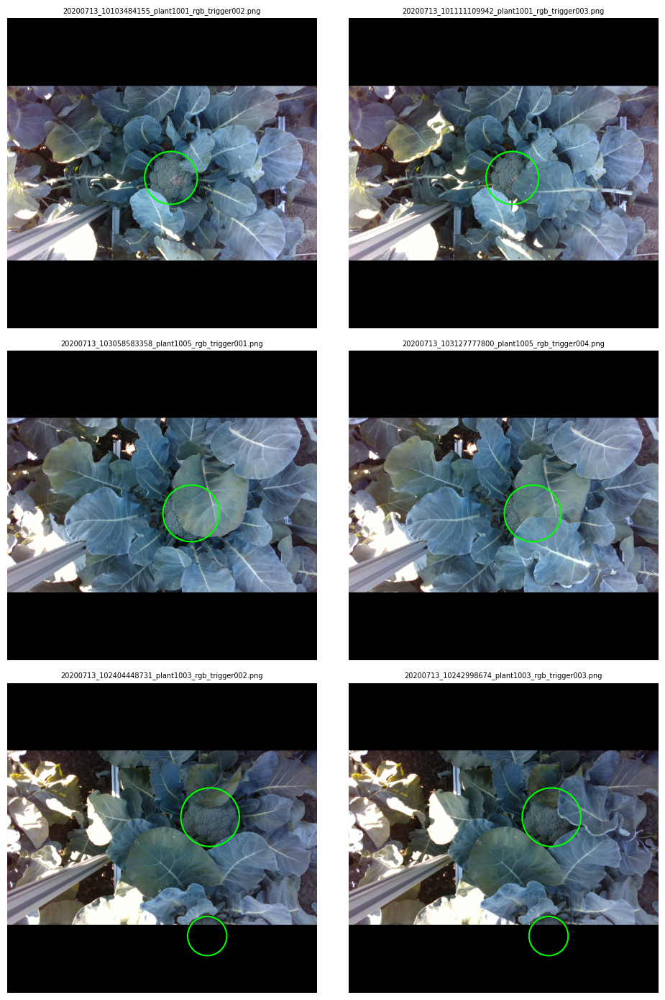

In [5]:
# Inspect images
fig, axes = plt.subplots(3, 2, figsize=(10, 14))

for row, split in enumerate(["train", "val", "test"]):
    for col, img_path in enumerate(sorted((data_root / split).glob("*.png"))[:2]):
        ann = json.load(open(img_path.with_suffix(".json")))
        ax = axes[row, col]
        ax.imshow(Image.open(img_path))
        ax.set_title(img_path.name, fontsize=7)
        ax.axis("off")

        for s in ann["shapes"]:
            (cx, cy), (ex, ey) = s["points"]
            radius = np.sqrt((ex - cx)**2 + (ey - cy)**2)
            ax.add_patch(patches.Circle((cx, cy), radius, linewidth=1.5,
                                         edgecolor="lime", facecolor="none"))

plt.tight_layout()
plt.show()


In [6]:
# Count labels
label_counts = defaultdict(lambda: defaultdict(int))

for split in splits:
    for jpath in (data_root / split).glob("*.json"):
        with open(jpath) as f:
            data = json.load(f)
        for shape in data.get("shapes", []):
            label_counts[split][shape["label"]] += 1

print("\n── Label counts per split ──")
all_labels = sorted({lbl for s in label_counts.values() for lbl in s})
header = f"{'label':>20}" + "".join(f"  {s:>6}" for s in splits)
print(header)
for lbl in all_labels:
    row = f"{lbl:>20}" + "".join(f"  {label_counts[s].get(lbl,0):>6}" for s in splits)
    print(row)


── Label counts per split ──
               label   train     val    test
            broccoli    1184     347     394


### 2. Custom Dataloader

In [7]:
class BroccoliGraspingDataset(torch.utils.data.Dataset):
    def __init__(self, root, split, transforms=None):
        self.root = root
        self.split_path = os.path.join(root, split)
        self.transforms = transforms
        # Filters for .png files and ensures they are sorted
        self.file_names = sorted([f[:-4] for f in os.listdir(self.split_path) if f.endswith('.png')])
        self.image_ids = {fname: i for i, fname in enumerate(self.file_names)}

    def __getitem__(self, idx):
        file_id = self.file_names[idx]
        img_path = os.path.join(self.split_path, f"{file_id}.png")
        json_path = os.path.join(self.split_path, f"{file_id}.json")

        img = Image.open(img_path).convert("RGB")
        with open(json_path) as f:
            data = json.load(f)

        boxes = []
        keypoints = []

        for shape in data['shapes']:
            # LabelMe circles are defined by a centre point and a point on the edge
            if shape['shape_type'] == 'circle':
                points = shape['points']
                cx, cy = points[0] # Centre (x, y)
                ex, ey = points[1] # Edge (x, y)

                # Euclidean distance for radius: sqrt((x2-x1)^2 + (y2-y1)^2)
                radius = np.sqrt((ex - cx)**2 + (ey - cy)**2)

                # Build XYXY bounding box: [xmin, ymin, xmax, ymax]
                boxes.append([cx - radius, cy - radius, cx + radius, cy + radius])

                # Keypoint format: [x, y, visibility=2]
                keypoints.append([cx, cy, 2])

        # Convert to tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.ones((len(boxes),), dtype=torch.int64) # Class 1 = Broccoli

        # Reshape keypoints to [N, 1, 3] (N objects, 1 point per object, 3 values)
        keypoints_tensor = torch.as_tensor(keypoints, dtype=torch.float32).reshape(-1, 1, 3)

        # Wrap image and boxes in tv_tensors (supported in v0.15+)
        img = tv_tensors.Image(img)
        target = {
            "boxes": tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=F.get_size(img)),
            "labels": labels,
            "keypoints": keypoints_tensor, # PLAIN TENSOR: Avoids 'AttributeError'
            "image_id": np.int64(abs(hash(file_id)) % (10**8)),
            "area": (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]),
            "iscrowd": torch.zeros((len(boxes),), dtype=torch.int64)
        }

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.file_names)

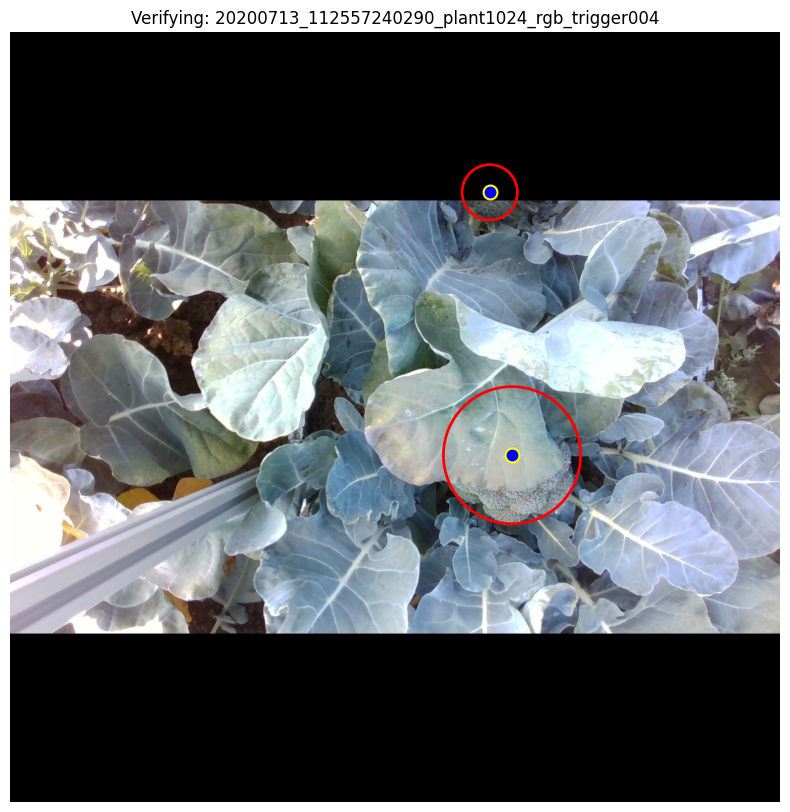

In [8]:
# base_path = r"Data\broccoli"
check_dataset = BroccoliGraspingDataset(data_root, split="train", transforms=None)
example = 42

img, target = check_dataset[example]

# 3. Convert (C, H, W) tensor to (H, W, C) for Matplotlib
plot_img = img.permute(1, 2, 0).numpy()

fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(plot_img)

# 4. Iterate through found broccoli heads
for i in range(len(target['boxes'])):
    # Get center from keypoint tensor [N, 1, 3]
    cx, cy = target['keypoints'][i, 0, 0], target['keypoints'][i, 0, 1]

    # Get radius back from our box calculation
    box = target['boxes'][i]
    radius = (box[2] - box[0]) / 2

    # Draw Red Circle
    circle = patches.Circle((cx, cy), radius, linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(circle)

    # Draw Grasping Point Dot
    ax.scatter(cx, cy, s=100, c='blue', edgecolors='yellow', linewidth=1.5, label='Grasping Point')

plt.title(f"Verifying: {check_dataset.file_names[example]}")
plt.axis('off')
plt.show()

#### Transforming data

In [9]:
import torchvision.transforms.v2 as T # Apart from F for standard API functions

def get_transforms(train=False):
    transforms = []

    # Convert PIL Image to tensor and cast to float
    transforms.append(T.ToImage())
    transforms.append(T.ToDtype(torch.float32, scale=True))  # Converts pixel from scales [0,255] -> floats in range of [0.0, 1.0]

    if train:
        transforms.append(T.RandomHorizontalFlip(p=0.5))
        transforms.append(T.RandomVerticalFlip(p=0.5))
        transforms.append(T.RandomRotation(degrees=30)) # Topdown images so training for rotations makes it more robust
        transforms.append(T.ColorJitter(brightness=0.4, contrast=0.3, saturation=0.3)) # Images are taken outdoor with quite some daylight so brightness and contrast can be moderate. 
                                                                                        # Saturation a little higher as green of brocolli does not stand out easily in the pictures. 

    transforms.append(T.ToPureTensor())  # Strip tv_tensors metadata after transforms are done

    return T.Compose(transforms)

### 3. Model Architecture

In [10]:
def get_keypoint_rcnn_model(num_keypoints=1):
    # Start from the Keypoint R-CNN pretrained weights
    model = torchvision.models.detection.keypointrcnn_resnet50_fpn(weights="DEFAULT")

    in_features = model.roi_heads.box_predictor.cls_score.in_features       # Replace the box predictor head 
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes=2) # num_classes = standard background and broccoli
    
    in_features_kp = model.roi_heads.keypoint_predictor.kps_score_lowres.in_channels        # Replace the keypoint predictor head
    model.roi_heads.keypoint_predictor = KeypointRCNNPredictor(in_features_kp, num_keypoints) # Pretrained model has 17 keypoints, we only need 1 per broccoli

    return model

# Quick check before training
model = get_keypoint_rcnn_model(num_keypoints=1)
print(model.roi_heads.keypoint_predictor)

KeypointRCNNPredictor(
  (kps_score_lowres): ConvTranspose2d(512, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
)


### 4. Training and Evaluation

In [11]:
#Hyperparameters for optimisation
config = {
    "num_epochs": 15, # model sees image once
    # try 5, 10, 15

    "batch_size": 4, # how many images processed before weight update
    # 2 gives noise gradients, can help generalisation, but slow less stable training
    # try 4

    "lr": 0.002, # too high unstable and too low slow convergence/stuck
    # Report: with 0.005: hit NaN loss after 50 batches in epoch 1  
    # 0.0005 works.
    # Try 0.001
    # dubble lr because dubble batch size

    "lr_step_size": 5, # 1 or 2 for epochs (5-10)
    "lr_gamma": 0.1, # drop from the previous step
    "momentum": 0.9, # standard default
    "weight_decay": 0.0005, # keep, unless strong overfitting

}
#  learning rate, learning rate schedulers, batch size, number of epochs

In [12]:
# Device start with CPU for debugging, switch to CUDA once confirmed working
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Using device: {device}")

# Datasets
train_dataset = BroccoliGraspingDataset(data_root, split="train", transforms=get_transforms(train=True))
val_dataset   = BroccoliGraspingDataset(data_root, split="val",   transforms=get_transforms(train=False))

# Dataloaders
train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=config["batch_size"],
    shuffle=True,
    collate_fn=utils.collate_fn
)

val_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=1,
    shuffle=False,
    collate_fn=utils.collate_fn
)

Using device: cuda


In [13]:
# Model
model = get_keypoint_rcnn_model(num_keypoints=1)
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=config["lr"],
    momentum=config["momentum"],
    weight_decay=config["weight_decay"]
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=config["lr_step_size"],
    gamma=config["lr_gamma"]
)

In [15]:
# Training loop: losses tracked per epoch for the loss curve plot below
train_losses = []
val_losses = []

for epoch in range(config["num_epochs"]):
    metric_logger = train_one_epoch(model, optimizer, train_loader, device, epoch+1, print_freq=10)
    train_losses.append(metric_logger.meters['loss'].global_avg)
    lr_scheduler.step()

    # Validation loss
    val_loss = 0.0
    model.train()
    with torch.no_grad():
        for images, targets in val_loader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v 
                        for k, v in t.items()} for t in targets]
            loss_dict = model(images, targets)
            val_loss += sum(loss for loss in loss_dict.values()).item()
    val_losses.append(val_loss / len(val_loader))
    model.eval()

    evaluate(model, val_loader, device=device)

Epoch: [1]  [  0/241]  eta: 0:06:24  lr: 0.002000  loss: 8.8016 (8.8016)  loss_classifier: 0.5651 (0.5651)  loss_box_reg: 0.0495 (0.0495)  loss_keypoint: 8.0322 (8.0322)  loss_objectness: 0.1484 (0.1484)  loss_rpn_box_reg: 0.0064 (0.0064)  time: 1.5934  data: 0.2560  max mem: 2828
Epoch: [1]  [ 10/241]  eta: 0:04:20  lr: 0.002000  loss: 8.4295 (7.7008)  loss_classifier: 0.2408 (0.2732)  loss_box_reg: 0.0631 (0.0583)  loss_keypoint: 8.0198 (7.2476)  loss_objectness: 0.0969 (0.1149)  loss_rpn_box_reg: 0.0070 (0.0068)  time: 1.1288  data: 0.2473  max mem: 3053
Epoch: [1]  [ 20/241]  eta: 0:04:01  lr: 0.002000  loss: 8.1628 (7.9591)  loss_classifier: 0.1311 (0.2010)  loss_box_reg: 0.0680 (0.0659)  loss_keypoint: 7.9285 (7.5988)  loss_objectness: 0.0613 (0.0868)  loss_rpn_box_reg: 0.0065 (0.0068)  time: 1.0666  data: 0.2421  max mem: 3053
Epoch: [1]  [ 30/241]  eta: 0:03:52  lr: 0.002000  loss: 8.0155 (8.0300)  loss_classifier: 0.1042 (0.1708)  loss_box_reg: 0.0773 (0.0764)  loss_keypoint: 

In [16]:
# Save model
torch.save(model.state_dict(), "keypoint_rcnn_broccoli_epoch15_loss0_002_step5_batchsize4.pth")
print(f"Saved successfully, file size: {os.path.getsize('keypoint_rcnn_broccoli_epoch15_loss0_002_step5_batchsize4.pth') / 1e6:.1f} MB")
print(f"\nPer-epoch losses: {[f'{l:.4f}' for l in train_losses]}")

Saved successfully, file size: 236.6 MB

Per-epoch losses: ['8.0111', '8.0033', '7.6798', '7.6982', '7.5675', '7.4060', '7.2919', '7.3344', '7.2074', '7.1633', '7.1961', '7.0294', '6.9777', '7.1423', '7.0588']


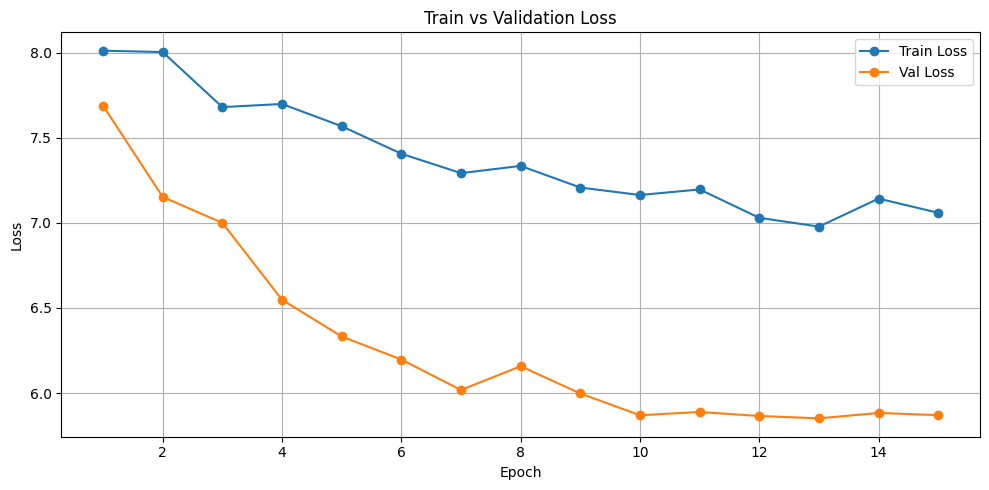

In [ ]:
# Loss curve
if len(train_losses) > 1:
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, config["num_epochs"] + 1), train_losses, label="Train Loss", marker="o")
    plt.plot(range(1, config["num_epochs"] + 1), val_losses, label="Val Loss", marker="o")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Train vs Validation Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("Plots/loss_val_train.png", dpi=150)
    plt.show()
else:
    print("Only 1 epoch trained: run more epochs to see a meaningful loss curve.")

### 5. Evaluation

In [14]:
# Load model and weights for evaluation
model = get_keypoint_rcnn_model(num_keypoints=1)
model.load_state_dict(torch.load("keypoint_rcnn_broccoli_epoch15_loss0_002_step5_batchsize4.pth", map_location=device))
model.to(device)
model.eval()

KeypointRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640, 672, 704, 736, 768, 800), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.

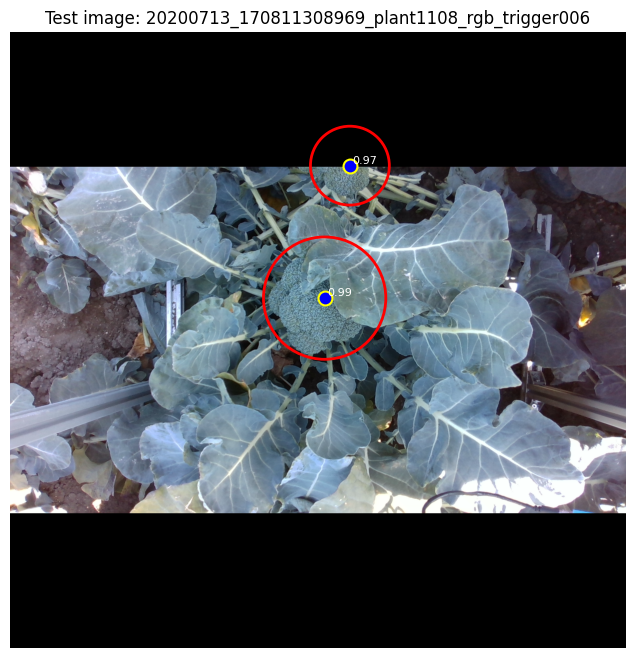

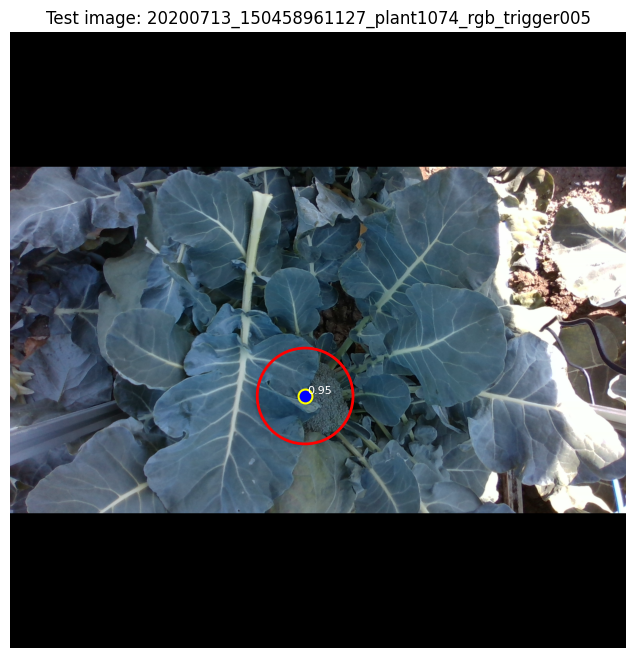

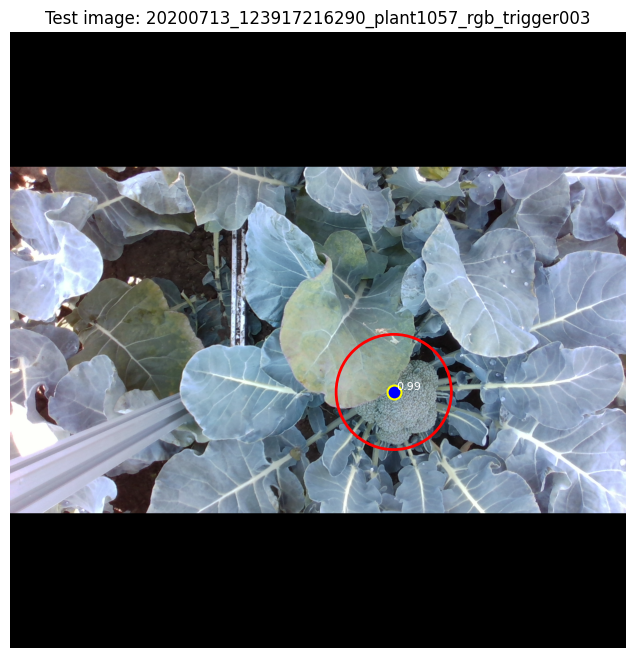

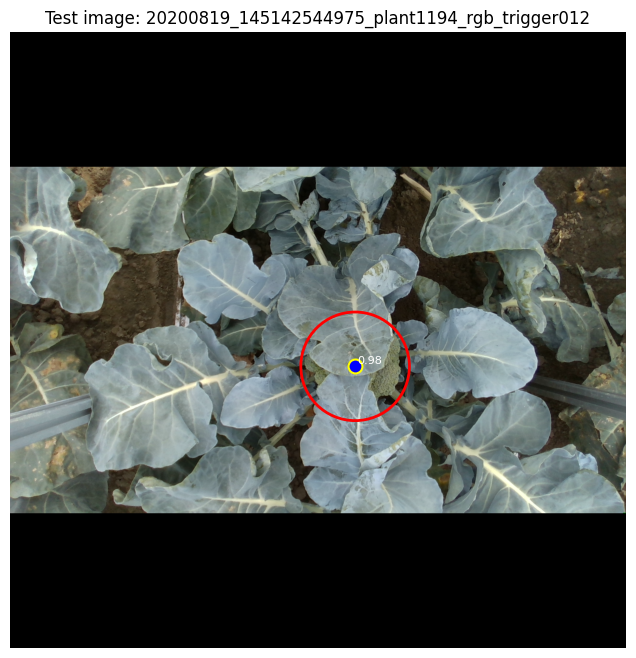

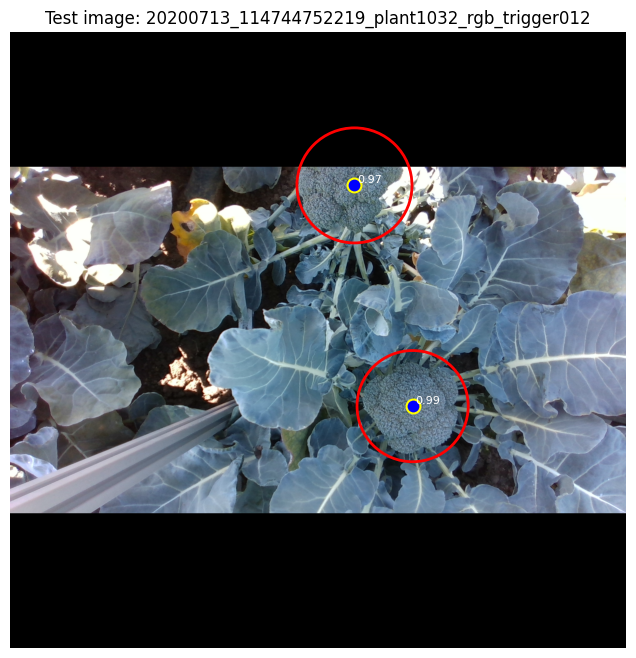

In [18]:
# Pick a few random test images and visualise predictions
test_dataset = BroccoliGraspingDataset(data_root, split="test", transforms=get_transforms(train=False))
test_indices = random.sample(range(len(test_dataset)), 5)

score_threshold = 0.8  # lower for weakly trained model; raise toward 0.8 after more epochs
                        # when no keypoint visible: confidence is lower than threshold
nms_threshold = 0.3

for idx in test_indices:
    img, target = test_dataset[idx]

    with torch.no_grad():
        prediction = model([img.to(device)])[0]

    # Filter by confidence score
    keep_score = prediction["scores"] >= score_threshold
    for k in prediction:
        prediction[k] = prediction[k][keep_score]

    # Apply NMS
    if len(prediction["boxes"]) > 0:
        keep = nms(prediction["boxes"], prediction["scores"], nms_threshold)
        for k in prediction:
            prediction[k] = prediction[k][keep]

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img.permute(1, 2, 0))

    for i in range(len(prediction["boxes"])):
        box   = prediction["boxes"][i].cpu()
        kp    = prediction["keypoints"][i, 0].cpu()  # [x, y, score]
        score = prediction["scores"][i].cpu()

        # Radius from predicted bounding box (matches check_dataset style)
        radius = (box[2] - box[0]) / 2
        circle = patches.Circle((kp[0], kp[1]), radius,
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(circle)

        # Grasping point dot: same style as check_dataset
        ax.scatter(kp[0], kp[1], s=100, c='blue', edgecolors='yellow', linewidth=1.5)
        ax.text(kp[0] + 5, kp[1] - 5, f"{score:.2f}", color='white', fontsize=8)

    ax.set_title(f"Test image: {test_dataset.file_names[idx]}")
    ax.axis('off')
    plt.show()

#### Quantitative Evaluation COCO / OKS Metrics
Using the COCO evaluator on the test set. Key metrics:
- Average Precision (keypoints): OKS-based average precision across IoU thresholds 0.50–0.95
- AP50 / AP75: AP at OKS thresholds 0.50 (medium) and 0.75 (high)
- AP (bbox): bounding-box detection AP. measures how well the model draws the circle around the broccoli

In [19]:
# Test DataLoader
test_dataset = BroccoliGraspingDataset(data_root, split="test", transforms=get_transforms(train=False))
test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=1,
    shuffle=False,
    collate_fn=utils.collate_fn
)
print(f"Test set: {len(test_dataset)} images")

Test set: 345 images


In [ ]:
# Quantitative evaluation on the test set using the COCO evaluator
# Reports OKS-based AP (keypoints) and bbox AP
print("=== Quantitative Evaluation: Test Set ===")
coco_evaluator = evaluate(model, test_loader, device=device)

=== Quantitative Evaluation: Test Set ===
creating index...
index created!
Test:  [  0/345]  eta: 0:02:18  model_time: 0.3666 (0.3666)  evaluator_time: 0.0000 (0.0000)  time: 0.4018  data: 0.0208  max mem: 3491
Test:  [100/345]  eta: 0:00:33  model_time: 0.1022 (0.1043)  evaluator_time: 0.0000 (0.0000)  time: 0.1413  data: 0.0329  max mem: 3491
Test:  [200/345]  eta: 0:00:19  model_time: 0.0997 (0.1027)  evaluator_time: 0.0000 (0.0000)  time: 0.1338  data: 0.0287  max mem: 3491
Test:  [300/345]  eta: 0:00:06  model_time: 0.0979 (0.1008)  evaluator_time: 0.0000 (0.0000)  time: 0.1363  data: 0.0322  max mem: 3491
Test:  [344/345]  eta: 0:00:00  model_time: 0.0910 (0.1005)  evaluator_time: 0.0000 (0.0000)  time: 0.1180  data: 0.0225  max mem: 3491
Test: Total time: 0:00:46 (0.1347 s / it)
Averaged stats: model_time: 0.0910 (0.1005)  evaluator_time: 0.0000 (0.0000)
Accumulating evaluation results...
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Averag

#### Keypoint Localization Error
Keypoint localization error + collect high-error cases in one pass.

Uses IoU-based Hungarian matching (closest to COCO methodology)

Mean keypoint localization error  : 13.0 px
Median keypoint localization error : 9.7 px
Missed detections (no prediction)  : 19 / 394


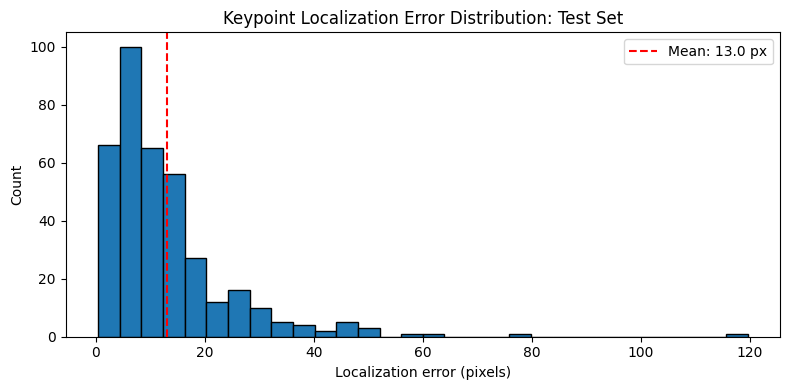


High-error cases (>50px): 24
  Missed detections : 19
  Wrong location    : 5


In [25]:
ERROR_THRESHOLD = 50

errors = []
missed = 0
high_error_cases = []

model.eval()
with torch.no_grad():
    for img_idx, (imgs, targets) in enumerate(test_loader):
        img = imgs[0].to(device)
        target = targets[0]
        gt_kps   = target["keypoints"]  # [N, 1, 3]
        gt_boxes = target["boxes"].cpu()  # [N, 4]

        pred = model([img])[0]

        keep = pred["scores"] >= score_threshold
        pred_boxes  = pred["boxes"][keep]
        pred_kps    = pred["keypoints"][keep]
        pred_scores = pred["scores"][keep]
        if len(pred_boxes) > 0:
            keep_nms = nms(pred_boxes, pred_scores, nms_threshold)
            pred_boxes  = pred_boxes[keep_nms]
            pred_kps    = pred_kps[keep_nms]
            pred_scores = pred_scores[keep_nms]

        if len(pred_kps) == 0:
            missed += len(gt_kps)
            for gt_kp in gt_kps:
                high_error_cases.append({
                    "img_idx": img_idx,
                    "img_tensor": imgs[0].cpu(),
                    "gt_xy": gt_kp[0, :2].cpu(),
                    "pred_xy": None,
                    "pred_score": None,
                    "all_pred_kps": pred_kps.cpu(),
                    "all_pred_scores": pred_scores.cpu(),
                    "error": float("inf"),
                    "error_type": "missed",
                })
            continue

        # IoU-based Hungarian matching
        pred_boxes_cpu = pred_boxes.cpu()
        iou_matrix = box_iou(gt_boxes, pred_boxes_cpu).numpy()  # [N_gt, N_pred]
        cost = 1 - iou_matrix
        gt_indices, pred_indices = linear_sum_assignment(cost)

        gt_xy_all   = gt_kps[:, 0, :2].cpu()
        pred_xy_all = pred_kps[:, 0, :2].cpu()

        matched_gt = set(gt_indices.tolist())

        for gt_i, pred_i in zip(gt_indices, pred_indices):
            if iou_matrix[gt_i, pred_i] == 0:
                # no box overlap: treat as missed
                missed += 1
                high_error_cases.append({
                    "img_idx": img_idx,
                    "img_tensor": imgs[0].cpu(),
                    "gt_xy": gt_xy_all[gt_i],
                    "pred_xy": None,
                    "pred_score": None,
                    "all_pred_kps": pred_xy_all,
                    "all_pred_scores": pred_scores.cpu(),
                    "error": float("inf"),
                    "error_type": "missed",
                })
                continue

            dist = torch.norm(gt_xy_all[gt_i] - pred_xy_all[pred_i]).item()
            errors.append(dist)

            if dist > ERROR_THRESHOLD:
                high_error_cases.append({
                    "img_idx": img_idx,
                    "img_tensor": imgs[0].cpu(),
                    "gt_xy": gt_xy_all[gt_i],
                    "pred_xy": pred_xy_all[pred_i],
                    "pred_score": pred_scores[pred_i].item(),
                    "all_pred_kps": pred_xy_all,
                    "all_pred_scores": pred_scores.cpu(),
                    "error": dist,
                    "error_type": "wrong_location",
                })

        # GTs with no matched prediction
        for gt_i in range(len(gt_kps)):
            if gt_i not in matched_gt:
                missed += 1
                high_error_cases.append({
                    "img_idx": img_idx,
                    "img_tensor": imgs[0].cpu(),
                    "gt_xy": gt_xy_all[gt_i],
                    "pred_xy": None,
                    "pred_score": None,
                    "all_pred_kps": pred_xy_all,
                    "all_pred_scores": pred_scores.cpu(),
                    "error": float("inf"),
                    "error_type": "missed",
                })

# Localisation error summary
if errors:
    print(f"Mean keypoint localization error  : {np.mean(errors):.1f} px")
    print(f"Median keypoint localization error : {np.median(errors):.1f} px")
    print(f"Missed detections (no prediction)  : {missed} / {missed + len(errors)}")

    plt.figure(figsize=(8, 4))
    plt.hist(errors, bins=30, edgecolor='black')
    plt.axvline(np.mean(errors), color='red', linestyle='--', label=f"Mean: {np.mean(errors):.1f} px")
    plt.xlabel("Localization error (pixels)")
    plt.ylabel("Count")
    plt.title("Keypoint Localization Error Distribution: Test Set")
    plt.legend()
    plt.tight_layout()
    plt.savefig("Plots/keypoint_localization_error.png", dpi=150)
    plt.show()
else:
    print("No matched predictions found: try lowering score_threshold.")

# High-error summary
missed_count = sum(1 for c in high_error_cases if c["error_type"] == "missed")
wrong_loc    = sum(1 for c in high_error_cases if c["error_type"] == "wrong_location")
print(f"\nHigh-error cases (>{ERROR_THRESHOLD}px): {len(high_error_cases)}")
print(f"  Missed detections : {missed_count}")
print(f"  Wrong location    : {wrong_loc}")


#### Qualitative Error Analysis
Visualises randomly sampled test cases where the keypoint localization error exceeds x px.
- **Green dot** = ground-truth grasping point
- **Red dot** = best-matched prediction (closest to GT)
- **Orange dots** = all other predictions in the image
- **MISSED** = no prediction survived the confidence threshold

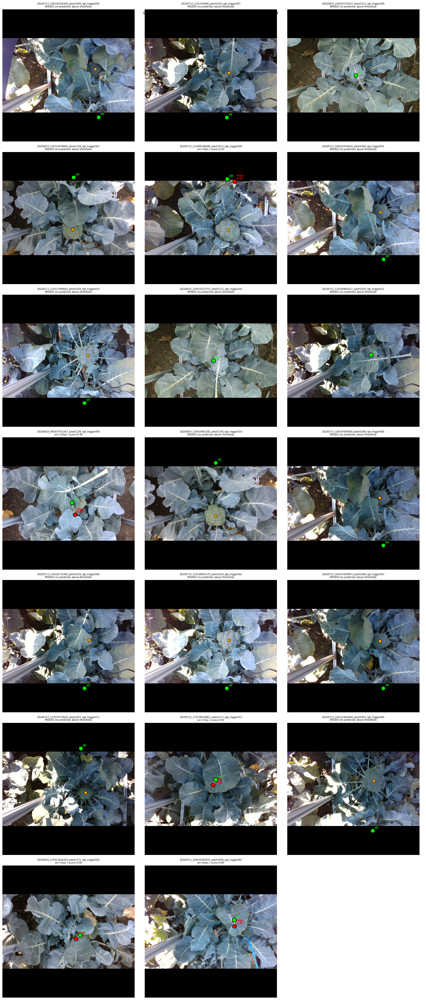

In [34]:
# Visualise randomly sampled high-error cases: GT (green) vs best prediction (red)
N_SAMPLES = 20
MAX_COLS = 3

cases_to_show = random.sample(high_error_cases, min(N_SAMPLES, len(high_error_cases)))

n = len(cases_to_show)
if n == 0:
    print("No high-error cases found.")
else:
    n_rows = (n + MAX_COLS - 1) // MAX_COLS
    fig, axes = plt.subplots(n_rows, MAX_COLS, figsize=(MAX_COLS * 6, n_rows * 6))
    axes = np.array(axes).reshape(-1)

    for ax_idx, case in enumerate(cases_to_show):
        ax = axes[ax_idx]
        img_np = case["img_tensor"].permute(1, 2, 0).numpy()
        ax.imshow(img_np)

        gt_x, gt_y = case["gt_xy"]

        for p_idx in range(len(case["all_pred_kps"])):
            px, py = case["all_pred_kps"][p_idx]
            ax.scatter(px, py, s=80, c="orange", edgecolors="black", linewidth=1, zorder=3)

        ax.scatter(gt_x, gt_y, s=150, c="lime", edgecolors="black", linewidth=1.5, zorder=5)
        ax.annotate("GT", (gt_x, gt_y), textcoords="offset points", xytext=(6, 6),
                    color="lime", fontsize=8, fontweight="bold")

        if case["error_type"] == "wrong_location":
            px, py = case["pred_xy"]
            ax.scatter(px, py, s=150, c="red", edgecolors="black", linewidth=1.5, zorder=5)
            ax.annotate(f"Pred\n{case['pred_score']:.2f}", (px, py),
                        textcoords="offset points", xytext=(6, 6),
                        color="red", fontsize=8, fontweight="bold")
            ax.annotate("", xy=(px, py), xytext=(gt_x, gt_y),
                        arrowprops=dict(arrowstyle="->", color="white", lw=1.5, linestyle="dashed"))
            title_extra = f"err={case['error']:.0f}px | score={case['pred_score']:.2f}"
        else:
            title_extra = "MISSED (no prediction above threshold)"

        fname = test_dataset.file_names[case["img_idx"]]
        ax.set_title(f"{fname}\n{title_extra}", fontsize=7)
        ax.axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    plt.suptitle(f"Qualitative Error Analysis: {N_SAMPLES} sampled cases with >{ERROR_THRESHOLD}px error", fontsize=13)
    plt.tight_layout()
    plt.savefig("Plots/qualitative_error_analysis.png", dpi=120)
    plt.show()
